In [1]:
from dataclasses import replace
from pathlib import Path
import os
import sys

_here = Path.cwd().resolve()
_repo_root = next(path for path in (_here, *_here.parents) if (path / "configs" / "cfg.py").exists())
os.chdir(_repo_root)
sys.path.insert(0, str(_repo_root))

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pprint import pprint
from IPython.display import Image, Markdown, display

from data.share_data import load_share_data
from scripts.madrl import SCHEMES, compute_ev_agent_cost_summary, compute_ev_cost_summary, plot_madrl_outputs, run_madrl_scheme_experiment
from utils.run_artifacts import load_experiment_context


In [2]:
run_dir = Path("artifacts/runs/madrl_traindays_7")
source_scheme = "madrl_projection_safe"
scheme_name = "madrl_projection_safe_EV_hard_costweight_priceaware"
cfg, run_dir = load_experiment_context(run_dir)
# EV hard-constraint configuration
cfg.env.ev_enabled = True
cfg.env.ev_state_continuity = True
cfg.reward.ev_charging_cost_weight = 1.0
cfg.reward.ev_price_aware_penalty_weight = 0.05
cfg.reward.ev_price_aware_threshold_quantile = 0.70
cfg.model.action_dim = 3
cfg.env.ev_capacity_kwh = (60.0, 60.0, 60.0)
cfg.env.ev_soc_min = 0.10
cfg.env.ev_soc_max = 0.91
cfg.env.ev_arrival_soc = 0.3
cfg.env.ev_departure_soc_req = 0.90
cfg.env.ev_max_charge_kw = (11.0, 11.0, 11.0)
cfg.env.ev_efficiency = 0.95
cfg.env.ev_arrival_step = 72
cfg.env.ev_departure_step = 28
cfg.env.ev_departure_constraint_mode = "hard"
cfg.env.ev_hard_projection_enabled = True
cfg.reward.ev_departure_penalty_weight = 0.0
cfg.reward.ev_soc_regularization_weight = 0.005
cfg.reward.ev_projection_penalty_weight = 0.0
cfg.env.ev_emergency_charging_enabled = False
# train days
cfg.env.train_window_days = 7
# train numbers
cfg.train.num_envs = 4
cfg.train.buffer_size = 100_000
cfg.train.batch_size = 512
cfg.train.learning_starts = 5376
cfg.train.actor_learning_starts = 8_064  # 原: 8_064 (7天调试)
cfg.train.n_step_return = 96
cfg.train.noise_decay_steps= 100_000
cfg.train.feasible_random_exploration_decay_steps = 50_000

share_data = load_share_data(run_dir / "share_data", cfg)
assert int(share_data.manifest["sequence_length"]) == int(cfg.obs.sequence_length)
spec = dict(next(item for item in SCHEMES if item["scheme"] == source_scheme))
spec["scheme"] = scheme_name
spec["controller"] = "MADRL_PROJECTION_EV_HARD_CostWeight_PriceAware"

spec["label"] = str(spec["label"]) + " + EV Hard Constraint + Price-Aware EV Penalty"
train_episodes = 1000
w_voltage, w_line, w_trafo = spec["reward"]

display(Markdown("# MADRL Projection Safe + EV Hard Constraint + Price-Aware EV Penalty"))
display(pd.DataFrame([{
    "run_dir": str(run_dir),
    "scheme": scheme_name,
    "source_scheme": source_scheme,
    "controller": spec["controller"],
    "train_episodes": train_episodes,
    "device": cfg.runtime.device,
    "train_window_days": int(cfg.env.train_window_days),
    "train_episode_steps": int(cfg.env.episode_steps) * int(cfg.env.train_window_days),
    "action_dim": int(cfg.model.action_dim),
    "ev_enabled": bool(cfg.env.ev_enabled),
    "ev_constraint_mode": cfg.env.ev_departure_constraint_mode,
    "ev_hard_projection_enabled": bool(cfg.env.ev_hard_projection_enabled),
    "ev_capacity_kwh": cfg.env.ev_capacity_kwh,
    "ev_arrival_soc": float(cfg.env.ev_arrival_soc),
    "ev_departure_soc_req": float(cfg.env.ev_departure_soc_req),
    "ev_max_charge_kw": cfg.env.ev_max_charge_kw,
    "ev_arrival_step": int(cfg.env.ev_arrival_step),
    "ev_departure_step": int(cfg.env.ev_departure_step),
    "ev_departure_penalty_weight": float(cfg.reward.ev_departure_penalty_weight),
    "ev_projection_penalty_weight": float(cfg.reward.ev_projection_penalty_weight),
    "w_voltage_pen": float(w_voltage),
    "w_line_pen": float(w_line),
    "w_trafo_pen": float(w_trafo),
}]))


# MADRL Projection Safe + EV Hard Constraint + Price-Aware EV Penalty

,run_dir,scheme,source_scheme,controller,train_episodes,device,train_window_days,train_episode_steps,action_dim,ev_enabled,...,ev_arrival_soc,ev_departure_soc_req,ev_max_charge_kw,ev_arrival_step,ev_departure_step,ev_departure_penalty_weight,ev_projection_penalty_weight,w_voltage_pen,w_line_pen,w_trafo_pen
0,artifacts\runs\madrl_traindays_7,madrl_projection_safe_EV_hard_costweight_price...,madrl_projection_safe,MADRL_PROJECTION_EV_HARD_CostWeight_PriceAware,1000,cuda,7,672,3,True,...,0.3,0.9,"(11.0, 11.0, 11.0)",72,28,0.0,0.0,400.0,0.0,10.0


In [3]:
result = run_madrl_scheme_experiment(cfg, run_dir, share_data, spec, episodes=train_episodes)

display(Markdown("## Train Summary"))
display(result["train_summary"])

saved = result["records"][scheme_name]
display(Markdown("## Test Metrics"))
display(saved["metrics_df"])
display(Markdown("## Agent Summary"))
display(saved["rollout"].summary)
pprint({"record_dir": str(saved["record_dir"])})

rollout = saved["rollout"]
display(Markdown("## Total Cost Summary"))
cost_ts, cost_summary = compute_ev_cost_summary(rollout, cfg)
agent_cost_summary = compute_ev_agent_cost_summary(rollout, cfg)
display(cost_summary)
display(Markdown("PV cost currently set to zero unless curtailment price/penalty is configured."))
display(Markdown("### Cost by Agent"))
display(agent_cost_summary)
agent_ev = rollout.agent_df.copy()
if {"ev_soc", "ev_charge_kw"}.issubset(agent_ev.columns):
    dt_hours = float(getattr(cfg.env, "dt_hours", rollout.meta.get("dt_hours", 0.25)))
    required_soc = float(cfg.env.ev_departure_soc_req)
    departure_step = int(cfg.env.ev_departure_step)
    departure_rows = agent_ev.loc[agent_ev["step"].astype(int) == departure_step].copy()
    if departure_rows.empty and "ev_departure_gap" in agent_ev.columns:
        departure_rows = agent_ev.loc[agent_ev["ev_departure_gap"].astype(float) > 0.0].copy()
    if departure_rows.empty:
        departure_rows = agent_ev.sort_values(["episode_idx", "agent_id", "step"]).groupby(["episode_idx", "agent_id"], as_index=False).tail(1)
    if "ev_departure_gap" not in departure_rows.columns:
        departure_rows["ev_departure_gap"] = (required_soc - departure_rows["ev_soc"].astype(float)).clip(lower=0.0)
    energy = agent_ev.assign(ev_energy_kwh=agent_ev["ev_charge_kw"].astype(float).clip(lower=0.0) * dt_hours).groupby("agent_id", as_index=False)["ev_energy_kwh"].sum()
    cost_col = "ev_charging_cost_eur" if "ev_charging_cost_eur" in agent_ev.columns else None
    if cost_col:
        cost = agent_ev.groupby("agent_id", as_index=False)[cost_col].sum().rename(columns={cost_col: "ev_cost_eur"})
    else:
        cost = pd.DataFrame({"agent_id": sorted(agent_ev["agent_id"].unique()), "ev_cost_eur": 0.0})
    departure = departure_rows.groupby("agent_id", as_index=False).agg(departure_soc=("ev_soc", "min"), departure_gap=("ev_departure_gap", "max"))
    ev_summary = departure.merge(energy, on="agent_id", how="outer").merge(cost, on="agent_id", how="outer")
    ev_summary = ev_summary.rename(columns={"agent_id": "agent"}).sort_values("agent")
    ev_summary["required_soc"] = required_soc
    ev_summary["satisfied"] = ev_summary["departure_gap"].fillna(0.0) <= 1e-6
    ev_summary = ev_summary.loc[:, ["agent", "departure_soc", "required_soc", "departure_gap", "satisfied", "ev_energy_kwh", "ev_cost_eur"]]
    display(Markdown("## EV Departure Requirement Summary"))
    display(ev_summary)
else:
    display(Markdown("## EV Departure Requirement Summary"))
    print("EV rollout fields are not available in this record. Re-run the EV hard experiment after updating scripts/madrl.py and utils/records.py.")

if {"ev_charge_kw_rl", "ev_charge_kw", "ev_projection_gap_kw", "ev_required_min_charge_kw"}.issubset(agent_ev.columns):
    hard_projection_summary = agent_ev.groupby("agent_id", as_index=False).agg(
        ev_charge_rl_kwh=("ev_charge_kw_rl", lambda x: float((x.clip(lower=0.0) * dt_hours).sum())),
        ev_charge_projected_kwh=("ev_charge_kw", lambda x: float((x.clip(lower=0.0) * dt_hours).sum())),
        ev_projection_gap_kwh=("ev_projection_gap_kw", lambda x: float((x.clip(lower=0.0) * dt_hours).sum())),
        max_required_min_charge_kw=("ev_required_min_charge_kw", "max"),
        hard_infeasible_steps=("ev_hard_infeasible", "sum"),
    ).rename(columns={"agent_id": "agent"})
    display(Markdown("## EV Hard Projection Summary"))
    display(hard_projection_summary)


# Price-aware EV charging diagnostics. This is post-processing only; it does not enter total cost.
if {"ev_charge_kw", "agent_id", "episode_idx", "step"}.issubset(agent_ev.columns):
    display(Markdown("## EV Price-Aware Charging Diagnostics"))
    price_cols = [c for c in ("episode_idx", "step", "timestamp", "wholesale_price", "import_price") if c in rollout.step_df.columns]
    ev_price = agent_ev.merge(rollout.step_df[price_cols].drop_duplicates(["episode_idx", "step"]), on=["episode_idx", "step"], how="left")
    price_col = "import_price" if "import_price" in ev_price.columns else "wholesale_price"
    if price_col in ev_price.columns:
        threshold_q = float(cfg.reward.ev_price_aware_threshold_quantile)
        ev_price["ev_energy_kwh"] = ev_price["ev_charge_kw"].astype(float).clip(lower=0.0) * dt_hours
        ev_price["episode_price_threshold"] = ev_price.groupby("episode_idx")[price_col].transform(lambda s: float(s.quantile(threshold_q)))
        ev_price["is_high_price"] = ev_price[price_col].astype(float) > ev_price["episode_price_threshold"].astype(float)
        ev_price["is_low_price"] = ~ev_price["is_high_price"]
        ev_price["price_x_energy"] = ev_price[price_col].astype(float) * ev_price["ev_energy_kwh"]
        rows = []
        for agent_id, frame in ev_price.groupby("agent_id", sort=True):
            total_energy = float(frame["ev_energy_kwh"].sum())
            high_energy = float(frame.loc[frame["is_high_price"], "ev_energy_kwh"].sum())
            low_energy = float(frame.loc[frame["is_low_price"], "ev_energy_kwh"].sum())
            avg_price = float(frame["price_x_energy"].sum() / total_energy) if total_energy > 1e-9 else np.nan
            corr = float(frame["ev_charge_kw"].astype(float).corr(frame[price_col].astype(float))) if frame["ev_charge_kw"].nunique() > 1 and frame[price_col].nunique() > 1 else np.nan
            rows.append({
                "agent": int(agent_id),
                "ev_price_aware_penalty_total": float(frame.get("ev_price_aware_penalty", pd.Series(0.0, index=frame.index)).astype(float).sum()),
                "ev_low_price_energy_kwh": low_energy,
                "ev_high_price_energy_kwh": high_energy,
                "high_price_energy_ratio": high_energy / total_energy if total_energy > 1e-9 else np.nan,
                "ev_charging_avg_price": avg_price,
                "corr_ev_charge_price": corr,
            })
        ev_price_summary = pd.DataFrame(rows)
        total_energy = float(ev_price["ev_energy_kwh"].sum())
        total_high = float(ev_price.loc[ev_price["is_high_price"], "ev_energy_kwh"].sum())
        total_low = float(ev_price.loc[ev_price["is_low_price"], "ev_energy_kwh"].sum())
        total_row = pd.DataFrame([{
            "agent": "all",
            "ev_price_aware_penalty_total": float(ev_price.get("ev_price_aware_penalty", pd.Series(0.0, index=ev_price.index)).astype(float).sum()),
            "ev_low_price_energy_kwh": total_low,
            "ev_high_price_energy_kwh": total_high,
            "high_price_energy_ratio": total_high / total_energy if total_energy > 1e-9 else np.nan,
            "ev_charging_avg_price": float(ev_price["price_x_energy"].sum() / total_energy) if total_energy > 1e-9 else np.nan,
            "corr_ev_charge_price": float(ev_price["ev_charge_kw"].astype(float).corr(ev_price[price_col].astype(float))) if ev_price["ev_charge_kw"].nunique() > 1 and ev_price[price_col].nunique() > 1 else np.nan,
        }])
        display(pd.concat([ev_price_summary, total_row], ignore_index=True))
    else:
        print("Price columns are not available in rollout.step_df; cannot compute price-aware EV diagnostics.")


train madrl_projection_safe_EV_hard_costweight_priceaware:   0%|          | 0/1000 [00:00<?, ?episode/s]

MADRL + Safety Projection + LSTM Forecast + EV Hard Constraint + Price-Aware EV Penalty/lstm:   0%|          |…

## Train Summary

,scheme,controller,label,algo,projection,episodes,steps,updates,elapsed_s,vec_env_kind,...,action_sample_s,env_step_s,replay_add_s,sample_update_s,other_s,batch_size,num_envs,parallel_episode_sampling,model_path,record_dir
0,madrl_projection_safe_EV_hard_costweight_price...,MADRL_PROJECTION_EV_HARD_CostWeight_PriceAware,MADRL + Safety Projection + LSTM Forecast + EV...,MATD3_SAFE_POC,True,1000,672000,166657,38453.066272,subproc,...,2746.730332,13283.867243,212.928365,22131.928009,77.612323,512,4,unique_active,artifacts\runs\madrl_traindays_7\models\madrl\...,artifacts\runs\madrl_traindays_7\results\lstm\...


## Test Metrics

,controller,soc_mode,storage_charge_cost_total_eur,storage_discharge_revenue_total_eur,storage_profit_total_eur,storage_objective_total_eur,system_other_cost_eur,total_eur,soc_penalty_total,voltage_penalty_total,...,voltage_step_delta_p95_pu,voltage_step_delta_max_pu,voltage_spread_mean_pu,voltage_spread_max_pu,trafo_overload_steps,trafo_loading_max_pct,feeder_netload_ramp_mean_abs_kw,feeder_netload_ramp_max_kw,battery_net_power_kw_mean_abs,returned_primary_objective_eur
0,MADRL + Safety Projection + LSTM Forecast + EV...,continuous,1024.161281,1076.62067,52.459389,-52.459389,291.350258,238.89087,24.115635,0.0,...,0.014399,0.049597,0.008743,0.037494,3,103.555473,27.975158,155.406004,39.224583,-52.459388


## Agent Summary

,controller,agent_id,agent_profile,reward,storage_profit_eur,mean_soc,ev_overcharge_gap,ev_overcharge_penalty,ev_price_aware_penalty
0,MADRL + Safety Projection + LSTM Forecast + EV...,0,SFH12,-197.051551,-86.779410,0.61885,0.150001,0.0,3.368953
1,MADRL + Safety Projection + LSTM Forecast + EV...,1,SFH18,-3.265939,78.998878,0.57167,0.120001,0.0,2.179196
2,MADRL + Safety Projection + LSTM Forecast + EV...,2,SFH20,-38.867389,60.239921,0.30125,0.150001,0.0,4.214732


{'record_dir': 'artifacts\\runs\\madrl_traindays_7\\results\\lstm\\MADRL_PROJECTION_EV_HARD_CostWeight_PriceAware\\record'}


## Total Cost Summary

,battery_total_cost_eur,ev_total_cost_eur,pv_total_cost_eur,total_cost_eur,total_ev_charge_requested_kwh,total_ev_charge_executed_kwh,total_ev_charge_clipped_kwh,ev_overcharge_gap_total,ev_overcharge_penalty_total,pv_cost_note
0,-52.459389,291.350258,0.0,238.890869,4053.680783,1805.369439,2248.311345,0.420002,0.0,PV cost currently set to zero unless curtailme...


PV cost currently set to zero unless curtailment price/penalty is configured.

### Cost by Agent

,agent,battery_cost_eur,ev_cost_eur,pv_cost_eur,total_cost_eur,ev_charge_requested_kwh,ev_charge_executed_kwh,ev_charge_clipped_kwh,ev_overcharge_gap,ev_overcharge_penalty
0,0,86.779410,109.808545,0.0,196.587955,1814.070595,616.421106,1197.649490,0.150001,0.0
1,1,-78.998878,84.217803,0.0,5.218925,853.078930,590.763886,262.315044,0.120001,0.0
2,2,-60.239921,97.323910,0.0,37.083989,1386.531258,598.184447,788.346811,0.150001,0.0


## EV Departure Requirement Summary

,agent,departure_soc,required_soc,departure_gap,satisfied,ev_energy_kwh,ev_cost_eur
0,0,0.91,0.9,0.0,True,616.421106,109.808545
1,1,0.90,0.9,0.0,True,590.763886,84.217803
2,2,0.91,0.9,0.0,True,598.184447,97.323910


## EV Hard Projection Summary

,agent,ev_charge_rl_kwh,ev_charge_projected_kwh,ev_projection_gap_kwh,max_required_min_charge_kw,hard_infeasible_steps
0,0,1814.070595,616.421106,0.000000,0.000000,0
1,1,801.951403,590.763886,51.127527,11.000001,0
2,2,1386.531258,598.184447,0.000000,0.000000,0


## EV Price-Aware Charging Diagnostics

,agent,ev_price_aware_penalty_total,ev_low_price_energy_kwh,ev_high_price_energy_kwh,high_price_energy_ratio,ev_charging_avg_price,corr_ev_charge_price
0,0,3.368953,269.280038,347.141068,0.563156,0.178139,0.171133
1,1,2.179196,441.996765,148.767121,0.251822,0.142557,-0.051141
2,2,4.214732,350.541765,247.642682,0.413991,0.162699,0.081269
3,all,9.762880,1061.818568,743.550871,0.411855,0.161380,0.068707


1. Power balance - EV hard price-aware penalty


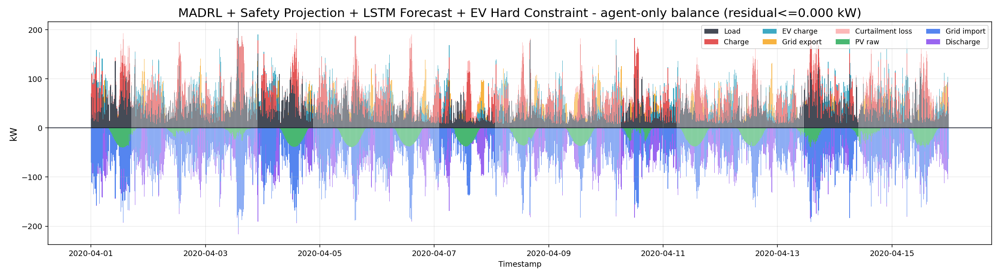

2. Price - EV hard price-aware penalty


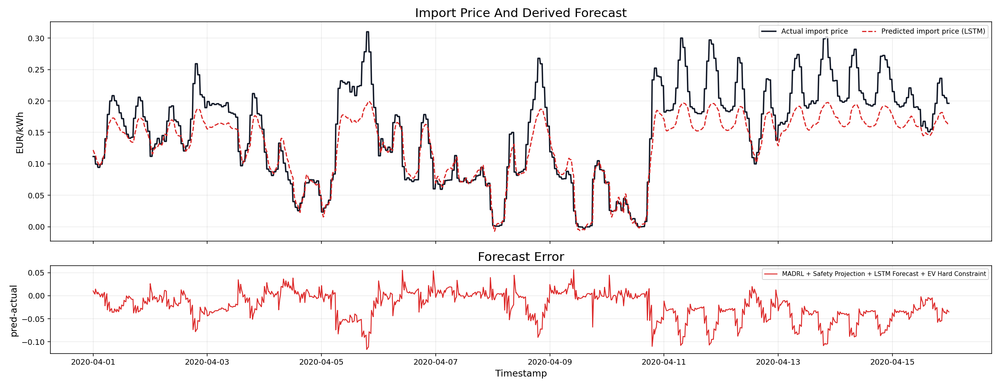

3. Battery power vs price - EV hard price-aware penalty


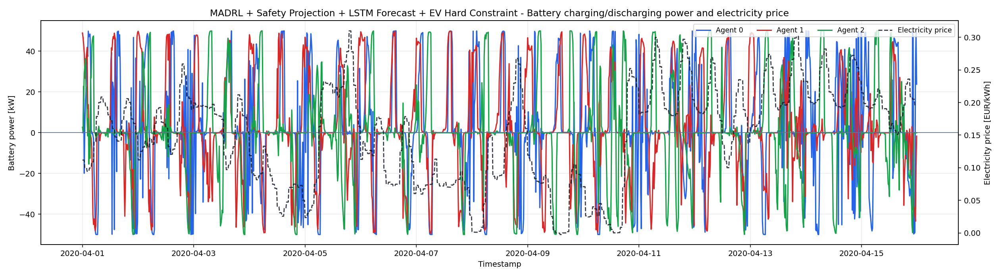

4. EV charging power vs price - EV hard price-aware penalty


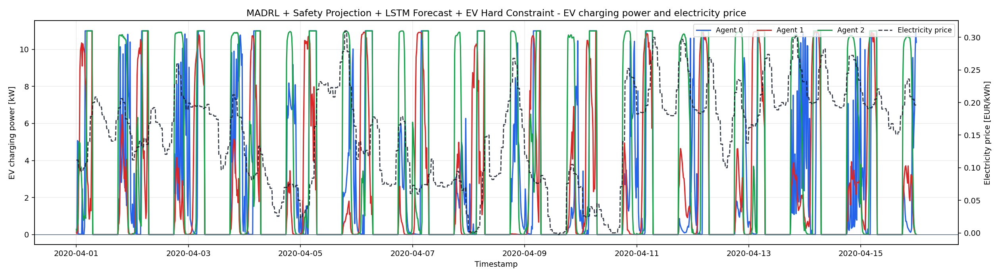

5. Total cumulative cost - EV hard price-aware penalty


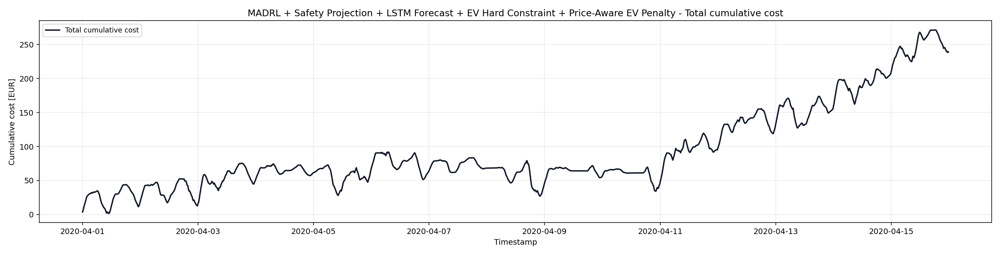

6. Cost components per step - EV hard price-aware penalty


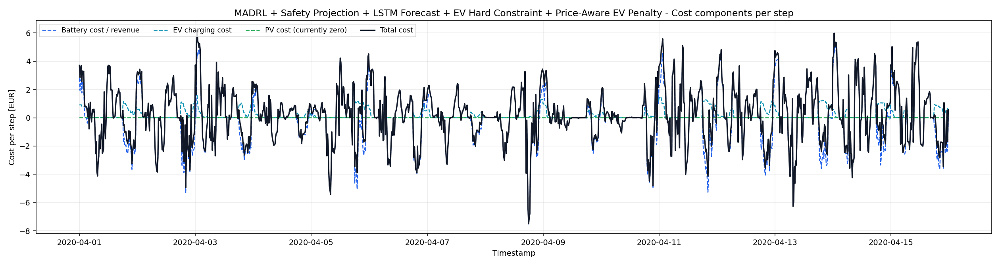

7. Cumulative cost components - EV hard price-aware penalty


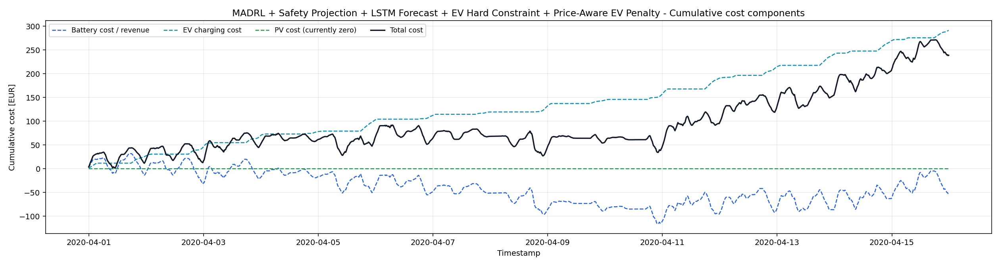

8. Battery power and SoC - EV hard price-aware penalty


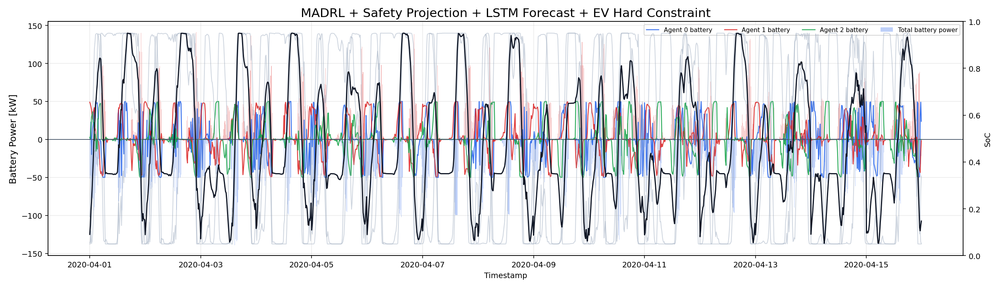

9. Voltage - EV hard price-aware penalty


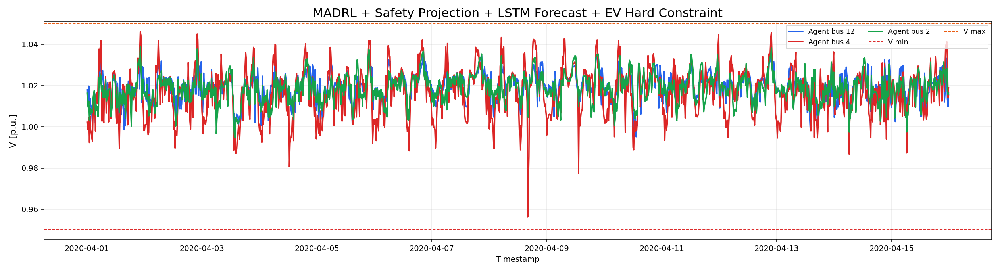

10. Net load - EV hard price-aware penalty


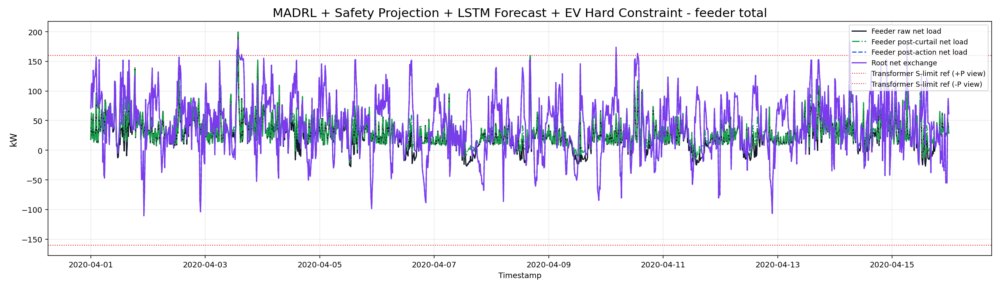

11. EV SOC - EV hard price-aware penalty


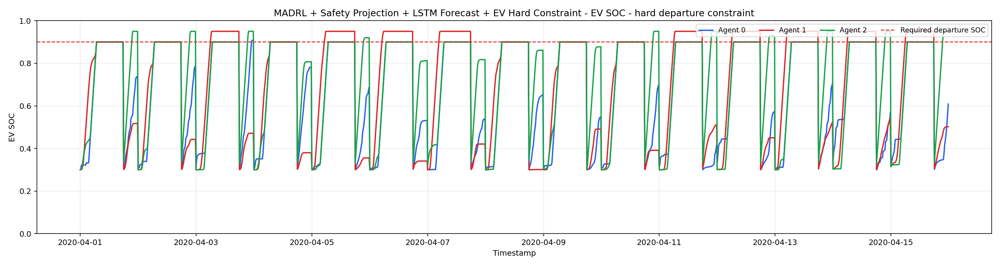

12. EV charging power - EV hard price-aware penalty


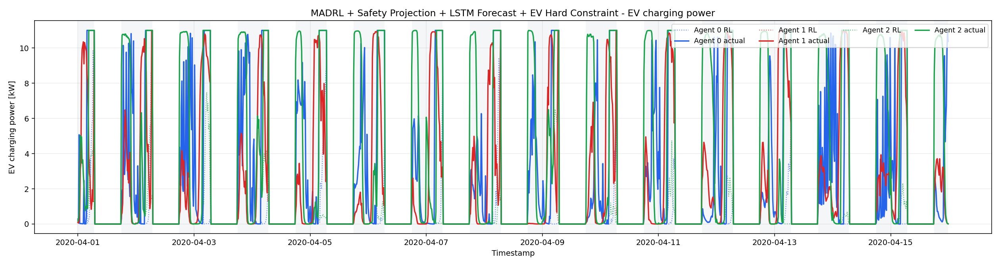

13. EV departure SOC requirement check - EV hard price-aware penalty


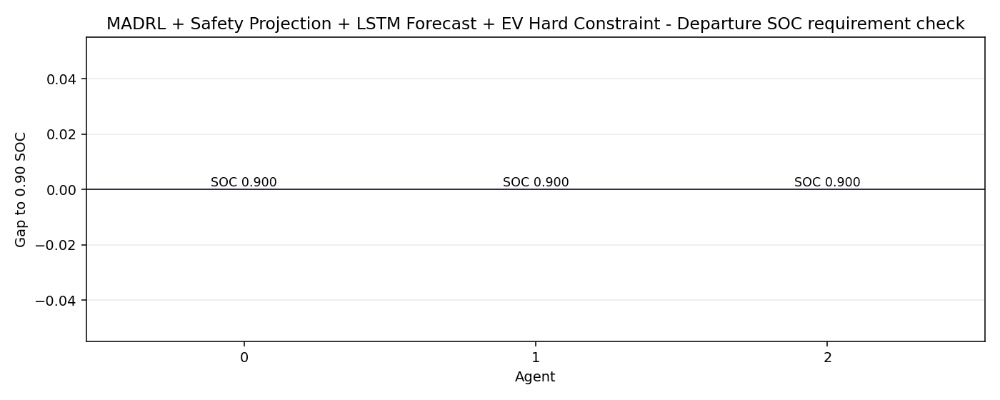

14. EV hard projection - EV hard price-aware penalty


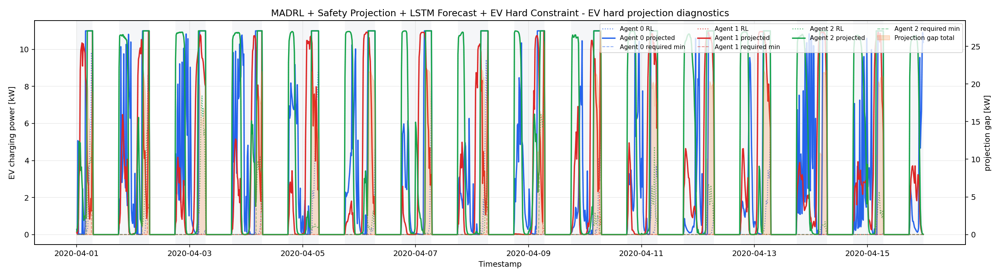

15. Training reward - EV hard price-aware penalty


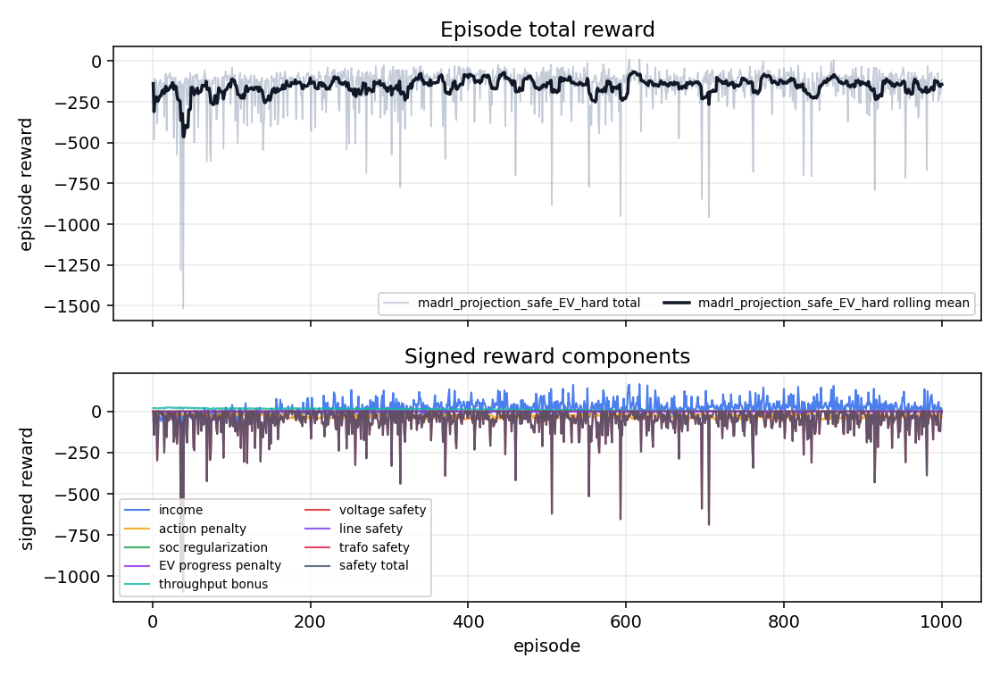

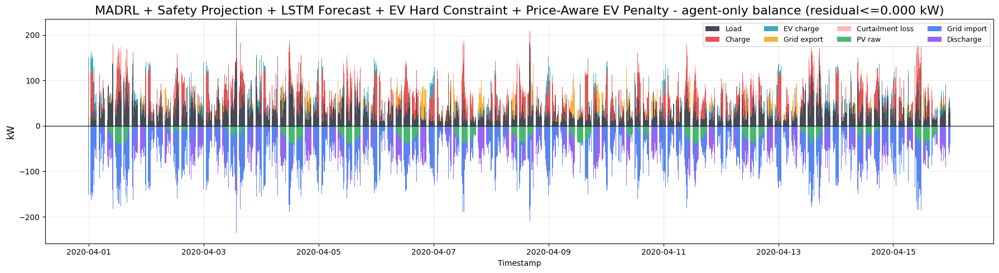

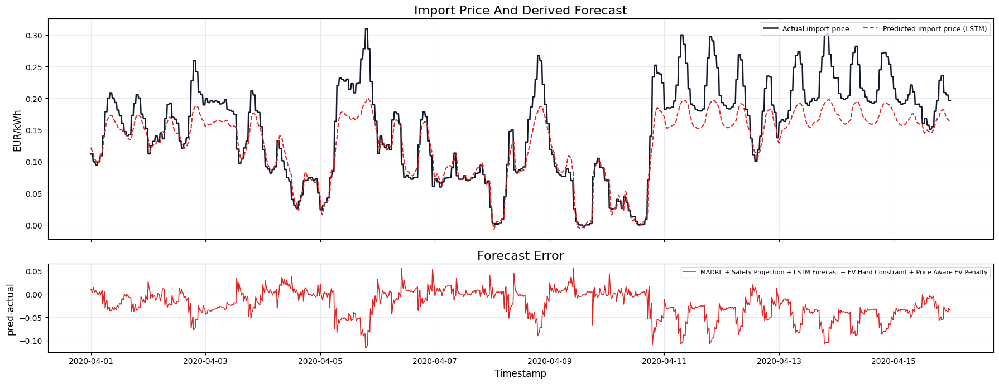

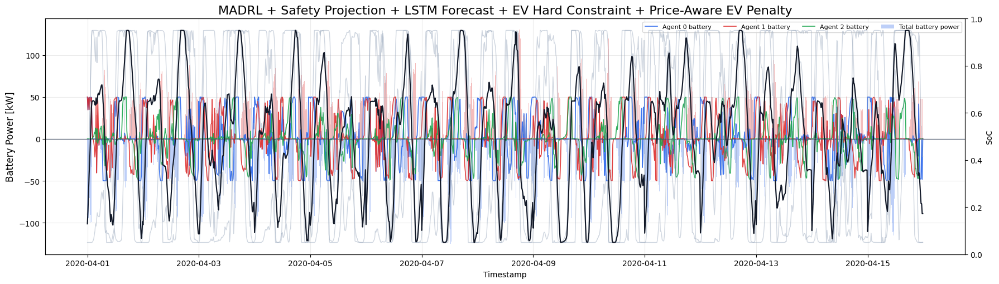

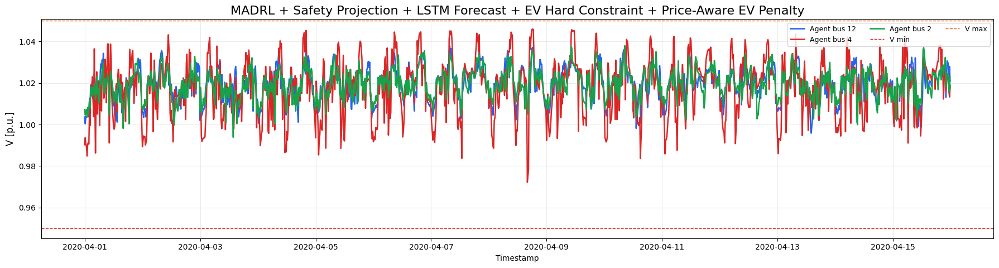

...

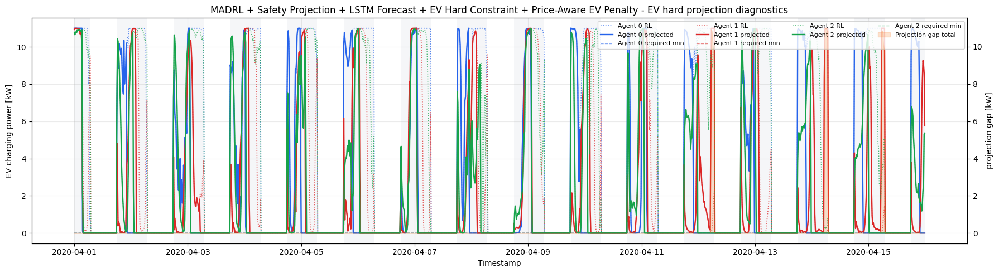

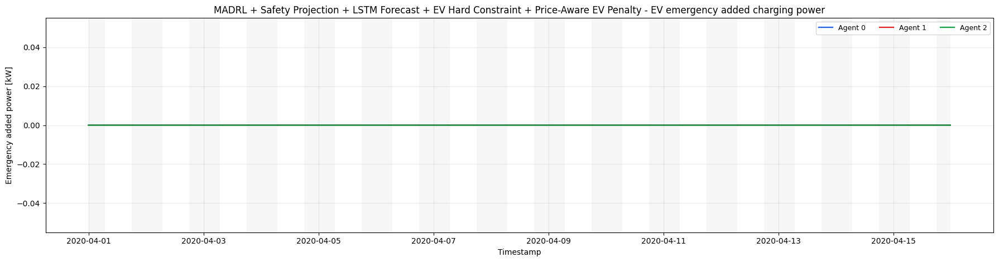

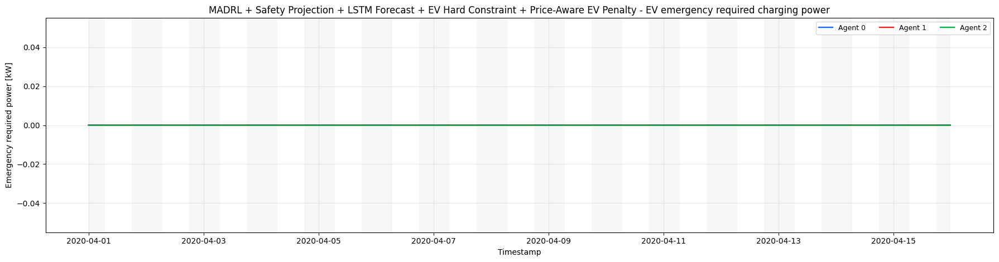

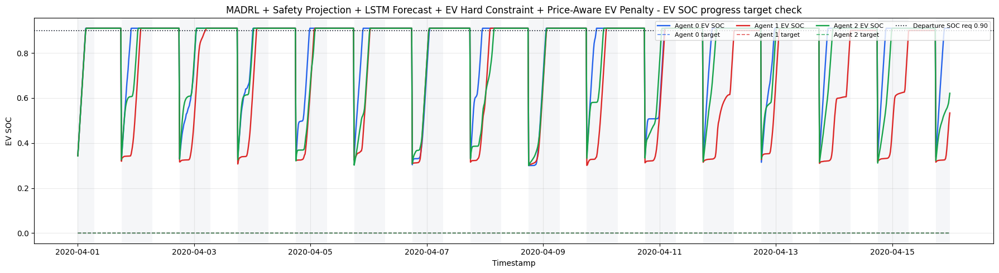

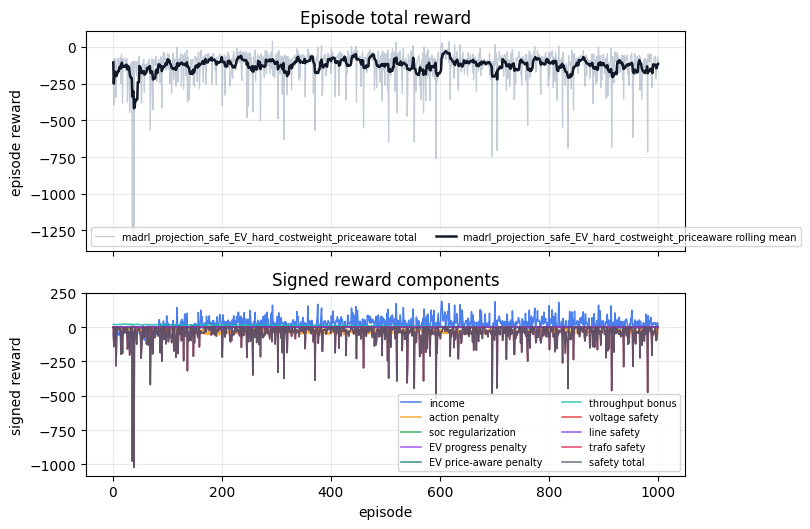

In [4]:
plt.close("all")
figures = plot_madrl_outputs(result, run_dir)
_plot_specs = [
    ("1. Power balance", "madrl_projection_safe_EV_hard_power_balance"),
    ("2. Price", "madrl_projection_safe_EV_hard_price"),
    ("3. Battery power vs price", "madrl_projection_safe_EV_hard_battery_power_price"),
    ("4. EV charging power vs price", "madrl_projection_safe_EV_hard_ev_charge_price"),
    ("5. Total cumulative cost", f"{scheme_name}_total_cost"),
    ("6. Cost components per step", f"{scheme_name}_cost_components"),
    ("7. Cumulative cost components", f"{scheme_name}_cumulative_cost_components"),
    ("8. Battery power and SoC", "madrl_projection_safe_EV_hard_battery_soc"),
    ("9. Voltage", "madrl_projection_safe_EV_hard_voltage"),
    ("10. Net load", "madrl_projection_safe_EV_hard_net_load"),
    ("11. EV SOC", "madrl_projection_safe_EV_hard_ev_soc"),
    ("12. EV charging power", "madrl_projection_safe_EV_hard_ev_charge_kw"),
    ("13. EV departure SOC requirement check", "madrl_projection_safe_EV_hard_ev_departure_check"),
    ("14. EV hard projection", "madrl_projection_safe_EV_hard_ev_hard_projection"),
    ("15. Training reward", "madrl_projection_safe_EV_hard_learning_curve"),
]
for title, name in _plot_specs:
    path = run_dir / "figures" / f"{name}.png"
    if path.exists():
        print(f"{title} - EV hard price-aware penalty")
        display(Image(filename=str(path)))
        if name in figures:
            plt.close(figures[name])
    else:
        print(f"[missing] {title}: {path}")
